REGRESSÃO LINEAR USANDO LINKS VIZINHOS.ANÁLISE DE 30 EM 30 MIN

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# from pyod.models.knn import KNN
from sklearn.cluster import KMeans
import seaborn as sns
from datetime import datetime, timedelta
import csv
from scipy import stats
from scipy.signal import correlate
from six.moves import cPickle as pickle
import pickle as _pickle
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import os

import heapq 
import pickle
%matplotlib inline
import statistics
    
import plotnine as p9
import dateutil
import datetime 
from dateutil.rrule import DAILY, rrule, MO, TU, WE, TH, FR

from sklearn.linear_model import LinearRegression
from yellowbrick.regressor import ResidualsPlot
import statsmodels.formula.api as sm


from sklearn import tree
import math

import warnings
warnings.filterwarnings('ignore')

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

/home/roque/env_proj/lib/python3.6/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


## Importando dados

Aqui foram criados dataframes de vários arquivos, cada arquivo corresponde a uma linha de onibus

In [4]:
# função criar dataframe
def createPkl(link):    
#     importa o arquivo pkl
    df = pd.read_pickle('../data/linktt/'+'link-'+link+'.pkl')
#     exclui colunas
#     df = df.drop(['_id', 'hour', 'link', 'trip_id', 'travel_id', 'month', 'weekday'], axis=1)
    df = df.drop(['_id', 'travel_id', 'month', 'weekday'], axis=1)
#     renomeia coluna ltt pelo nome do link
#     df = df.rename(columns={"ltt": name})
    return df

### Prieira vizualização dos dados.
foram removidas colunas que não tem serventia como mes e dia da semana, já que a coluna aproxlinkstart possui os dados completos de dia mes hora ano. O dataset possui 977.524 linhas de entradas de dados, restaram as colunas:

aproxlinkstart - data e hora

hour - hora

link - trecho da linha de onibus

ltt - tempo de viagem

trip_id - código da linha

In [5]:
# Importa lista com links
all_links = pd.read_csv('../data/gtfs/links.txt', sep='\n')
# renomeia a coluna que foi criada com o nome do primero link para all_links
all_links = all_links.rename(columns={"(576, 577)": "all_links"})
# cria um dataframe dataset_pkl
dataset_pkl = pd.DataFrame()
# Concatena todos os links
for link in all_links['all_links']:
    df = createPkl(link)
    dataset_pkl = pd.concat([dataset_pkl, df], sort=True)


dataset_pkl
# Prieira vizualização dos dados, foram retiradas colnas que não tem serventia como mes e dia da semana, 
# já que a coluna aproxlinkstart possui os dados completos de dia mes hora ano 
# o dataset possui 977.524 linhas de entradas de dados

,aproxlinkstart,hour,link,ltt,trip_id
0,2017-01-02 06:26:46.054,6,"(577, 578)",192.242289,6475-10-0
1,2017-01-02 06:57:03.961,6,"(577, 578)",286.324701,6475-10-0
2,2017-01-02 07:03:42.030,7,"(577, 578)",519.623291,6475-10-0
3,2017-01-02 07:24:18.127,7,"(577, 578)",444.353503,6475-10-0
4,2017-01-02 07:40:59.560,7,"(577, 578)",682.389588,6475-10-0
...,...,...,...,...,...
7860,2017-09-29 21:04:53.677,21,"(795, 796)",107.890092,2080-10-0
7861,2017-09-29 21:32:17.581,21,"(795, 796)",85.350079,2080-10-0
7862,2017-09-29 21:41:39.458,21,"(795, 796)",89.538335,2080-10-0
7863,2017-09-29 22:10:03.770,22,"(795, 796)",61.377175,2080-10-0


## Criando um timestamp
um timestamp é uma medida de tempo unix, um numero unico que marca cada hora, mostrando um valor relativo a cada hora, uma forma de medir uma valor interativo de horas.

Foi introduzida uma coluna time_stamp_start, contendo o valor de hora transformado.

In [7]:
# função tranforma a hora do datetime
def hr_func(ts):
    return ts.hour
# Cria uma coluna com dias
dataset_pkl['day'] = [d.day for d in dataset_pkl['aproxlinkstart']]
# Cria uma coluna com as horas
dataset_pkl['day_hour'] = dataset_pkl['aproxlinkstart'].apply(hr_func) #já tem a coluna hour
# Coloca a coluna aproxlinkstart com datetime como indice
dataset_pkl.index = dataset_pkl['aproxlinkstart']
# Cria uma coluna com timestamp
dataset_pkl['time_stamp_start'] = [d.timestamp() for d in dataset_pkl['aproxlinkstart']]

dataset_pkl

,aproxlinkstart,hour,link,ltt,trip_id,day,day_hour,time_stamp_start
aproxlinkstart,,,,,,,,
2017-01-02 06:26:46.054,2017-01-02 06:26:46.054,6,"(577, 578)",192.242289,6475-10-0,2,6,1.483338e+09
2017-01-02 06:57:03.961,2017-01-02 06:57:03.961,6,"(577, 578)",286.324701,6475-10-0,2,6,1.483340e+09
2017-01-02 07:03:42.030,2017-01-02 07:03:42.030,7,"(577, 578)",519.623291,6475-10-0,2,7,1.483341e+09
2017-01-02 07:24:18.127,2017-01-02 07:24:18.127,7,"(577, 578)",444.353503,6475-10-0,2,7,1.483342e+09
2017-01-02 07:40:59.560,2017-01-02 07:40:59.560,7,"(577, 578)",682.389588,6475-10-0,2,7,1.483343e+09
...,...,...,...,...,...,...,...,...
2017-09-29 21:04:53.677,2017-09-29 21:04:53.677,21,"(795, 796)",107.890092,2080-10-0,29,21,1.506719e+09
2017-09-29 21:32:17.581,2017-09-29 21:32:17.581,21,"(795, 796)",85.350079,2080-10-0,29,21,1.506721e+09
2017-09-29 21:41:39.458,2017-09-29 21:41:39.458,21,"(795, 796)",89.538335,2080-10-0,29,21,1.506721e+09


##  Detectando outliers
Abaixo uma analise de outliers do tempo de viagem e do timestap que é uma medidade de tempo unix, existe muito valores inconsistentes no tempo de viagem (coluna ltt), enquanto o timestamp parecer estar bem mais equilibrado.


{'whiskers': [<matplotlib.lines.Line2D at 0x7fb6aeaf8b70>,
 'caps': [<matplotlib.lines.Line2D at 0x7fb6aeb062e8>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fb6b06abf98>],
 'medians': [<matplotlib.lines.Line2D at 0x7fb6aeb069e8>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fb6aeb06d68>],
 'means': []}

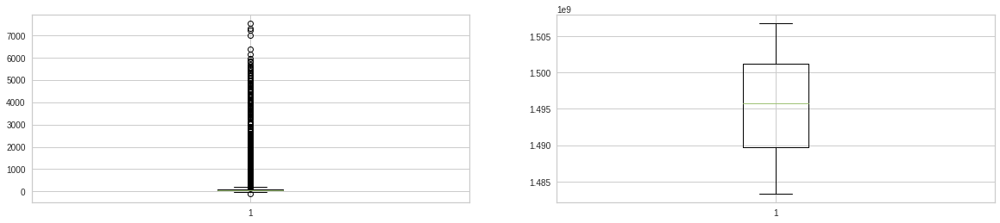

In [8]:
#  Detectando outliers
f, axarr = plt.subplots(1, 2, figsize=(20, 4))
axarr[0].boxplot(dataset_pkl["ltt"], showfliers=True)
axarr[1].boxplot(dataset_pkl["time_stamp_start"], showfliers=True)

## outliers
Outro gráfico mostrando que, apesar de poucos, existem diversos valores conflitantes (outliers), etre 1000 e 7000 segundos de tempo de viagem.

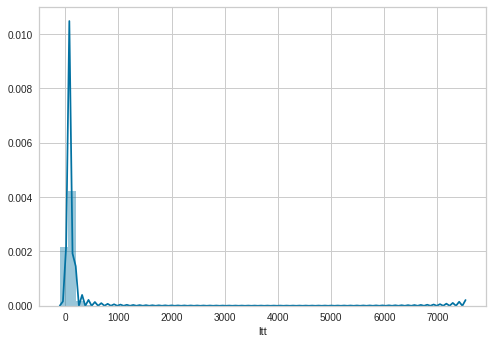

In [9]:
sns.distplot(dataset_pkl['ltt'])

# Série temporal
Série temporal com dados de tempo de viagem (ltt) dos nove meses de coleta de todas as linhas

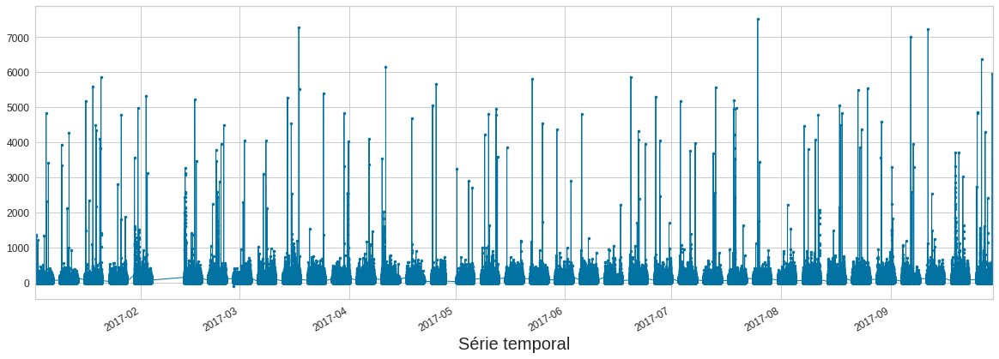

In [10]:
dataset_pkl['ltt'].plot(figsize=(20,7), linewidth=1, fontsize=12, marker = ".")
plt.xlabel('Série temporal', fontsize=20);

## Verificação entre correlação total entre as variáveis do dataset
Parece que o tempo de viagem (ltt) e o timestamp gerado a partir da data podem ser as variáveis mais indicadas a terem uma correlação

In [11]:
dataset_pkl.corr()

,hour,ltt,day,day_hour,time_stamp_start
hour,1.000000,-0.020163,-0.006387,1.000000,-0.002674
ltt,-0.020163,1.000000,-0.000416,-0.020163,0.018841
day,-0.006387,-0.000416,1.000000,-0.006387,0.115657
day_hour,1.000000,-0.020163,-0.006387,1.000000,-0.002674
time_stamp_start,-0.002674,0.018841,0.115657,-0.002674,1.000000


In [12]:
# covariancia.
dataset_pkl.cov()

,hour,ltt,day,day_hour,time_stamp_start
hour,27.671448,-8.134163e+00,-2.955104e-01,27.671448,-9.456981e+04
ltt,-8.134163,5.881234e+03,-2.808163e-01,-8.134163,9.714602e+06
day,-0.295510,-2.808163e-01,7.735237e+01,-0.295510,6.838866e+06
day_hour,27.671448,-8.134163e+00,-2.955104e-01,27.671448,-9.456981e+04
time_stamp_start,-94569.808932,9.714602e+06,6.838866e+06,-94569.808932,4.520155e+13


In [13]:
standardized_ltt = dataset_pkl
standardized_ltt

,aproxlinkstart,hour,link,ltt,trip_id,day,day_hour,time_stamp_start
aproxlinkstart,,,,,,,,
2017-01-02 06:26:46.054,2017-01-02 06:26:46.054,6,"(577, 578)",192.242289,6475-10-0,2,6,1.483338e+09
2017-01-02 06:57:03.961,2017-01-02 06:57:03.961,6,"(577, 578)",286.324701,6475-10-0,2,6,1.483340e+09
2017-01-02 07:03:42.030,2017-01-02 07:03:42.030,7,"(577, 578)",519.623291,6475-10-0,2,7,1.483341e+09
2017-01-02 07:24:18.127,2017-01-02 07:24:18.127,7,"(577, 578)",444.353503,6475-10-0,2,7,1.483342e+09
2017-01-02 07:40:59.560,2017-01-02 07:40:59.560,7,"(577, 578)",682.389588,6475-10-0,2,7,1.483343e+09
...,...,...,...,...,...,...,...,...
2017-09-29 21:04:53.677,2017-09-29 21:04:53.677,21,"(795, 796)",107.890092,2080-10-0,29,21,1.506719e+09
2017-09-29 21:32:17.581,2017-09-29 21:32:17.581,21,"(795, 796)",85.350079,2080-10-0,29,21,1.506721e+09
2017-09-29 21:41:39.458,2017-09-29 21:41:39.458,21,"(795, 796)",89.538335,2080-10-0,29,21,1.506721e+09


## Gerando séries temporais
A partir de cada link geraremos as séries temporais de tempo de viagem para cada hora do dia, cada linha representa uma dia do mês, e a progressao de cada dia nos horários de 6:00 as 23:59.
Como há bastante outliers, os dados ficaram com desvios visivais em cada gráfico.

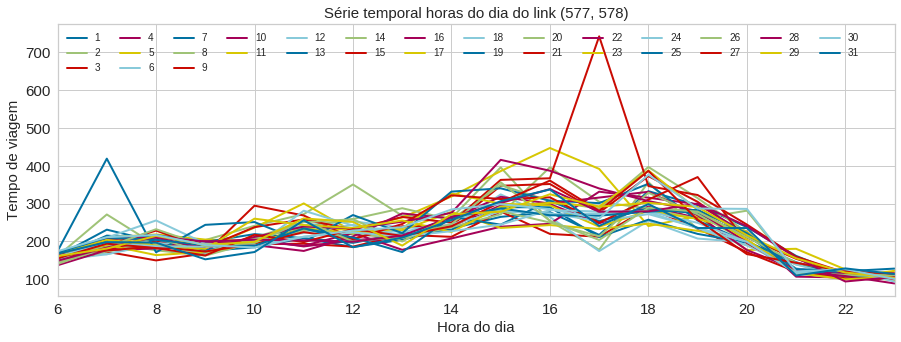

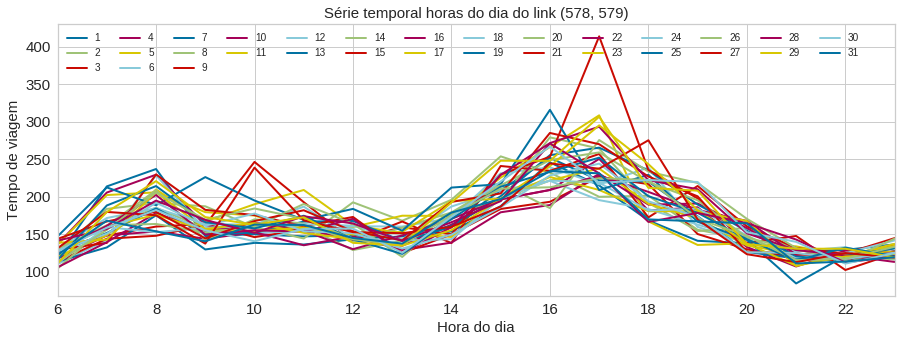

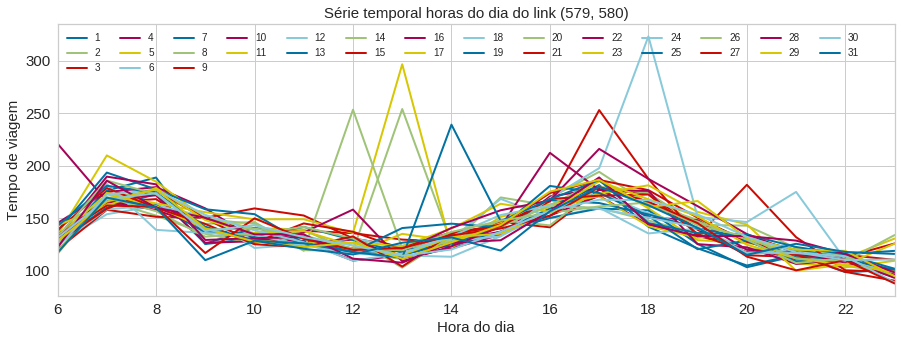

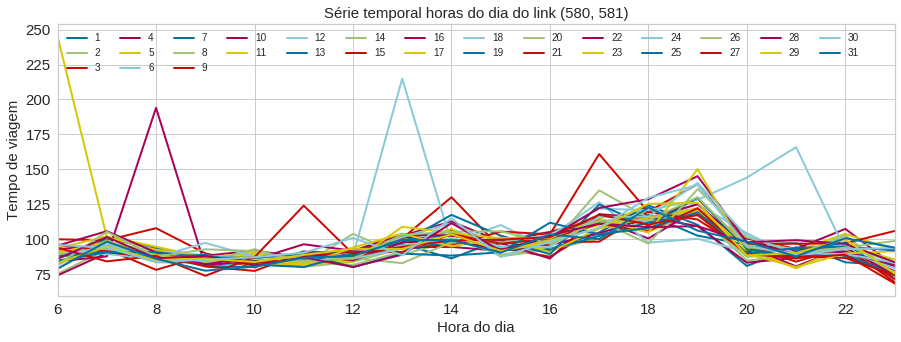

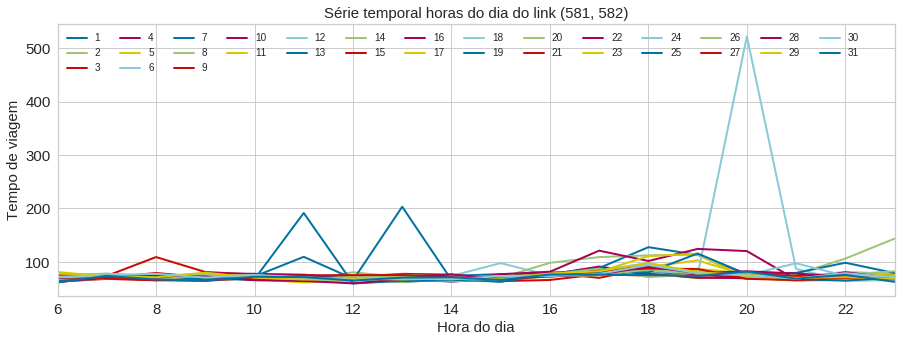

...

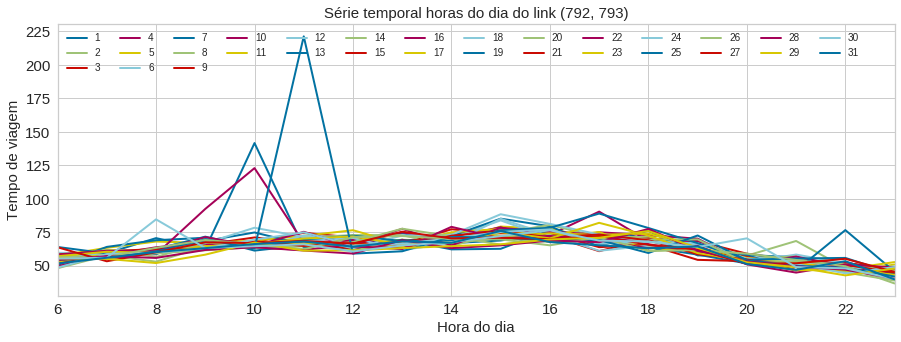

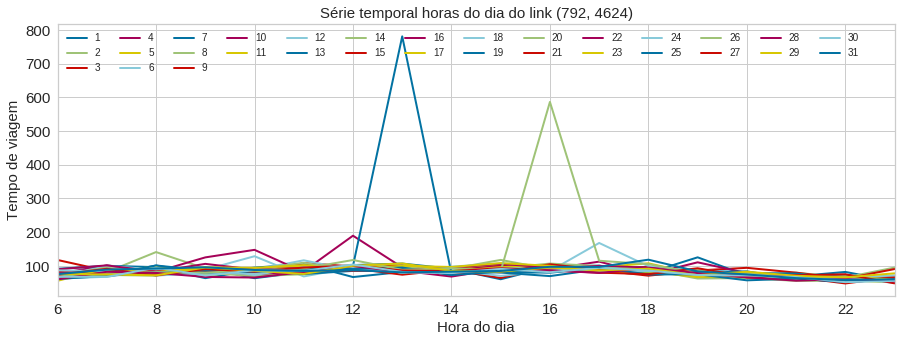

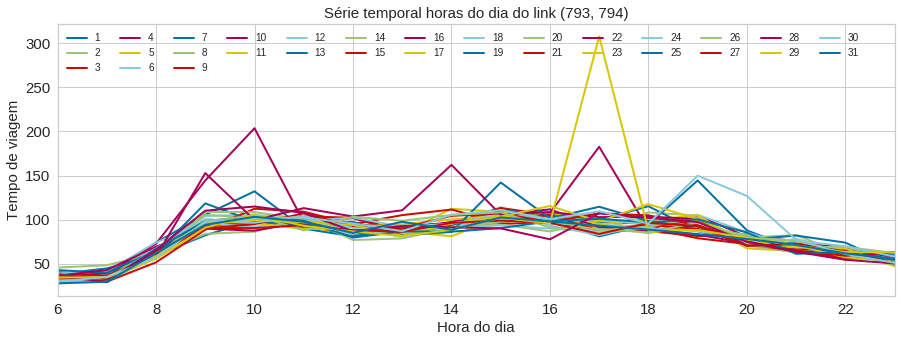

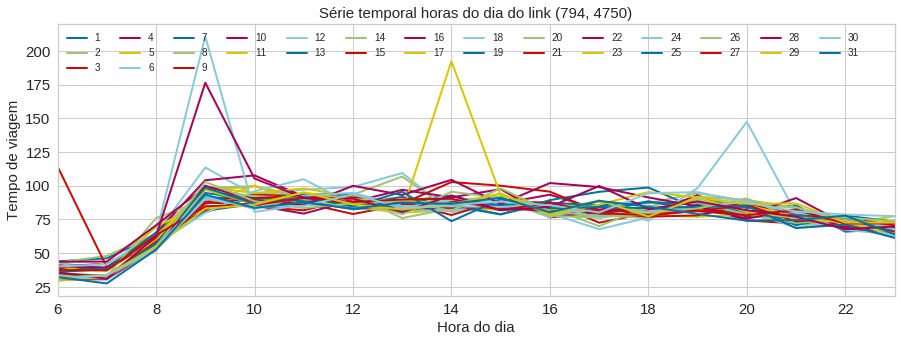

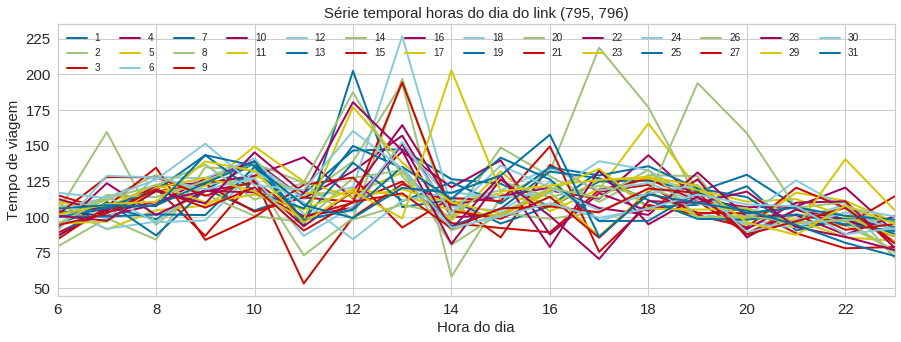

In [14]:
for link in all_links['all_links']:
    link_ltt = dataset_pkl.loc[(dataset_pkl['link'] == link)].groupby(['day_hour', 'day'], as_index=True )['ltt'].mean().unstack()
#     print(link_ltt)
    link_ltt.plot(figsize=(15,5), linewidth=2, fontsize=15, marker = "")
    plt.legend(loc='upper left', bbox_to_anchor=(0, 1), shadow=True, ncol=14)
    plt.title('Série temporal horas do dia do link '+ link, fontsize=15)
    plt.xlabel('Hora do dia', fontsize=15);
    plt.ylabel('Tempo de viagem', fontsize=15);

    

# removendo outliers acima de 400

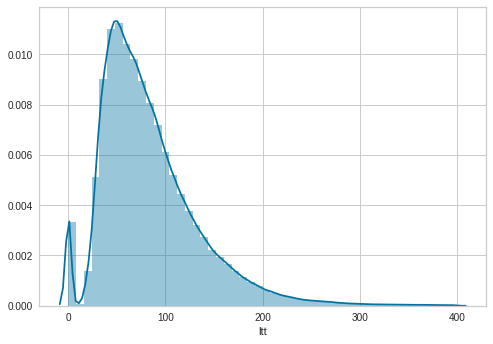

In [15]:
no_outlier = dataset_pkl[(dataset_pkl['ltt'] > 0) & (dataset_pkl['ltt'] < 400)]
sns.distplot(no_outlier['ltt'])


## Gerando séries temporais sem outliers
A partir de cada link geraremos as séries temporais de tempo de viagem para cada hora do dia, cada linha representa uma dia do mês, e a progressao de cada dia nos horários de 6:00 as 23:59.

Sem os outliers, dá pra perceber uma certa tendencia, com caracteristica diferente para cada linha

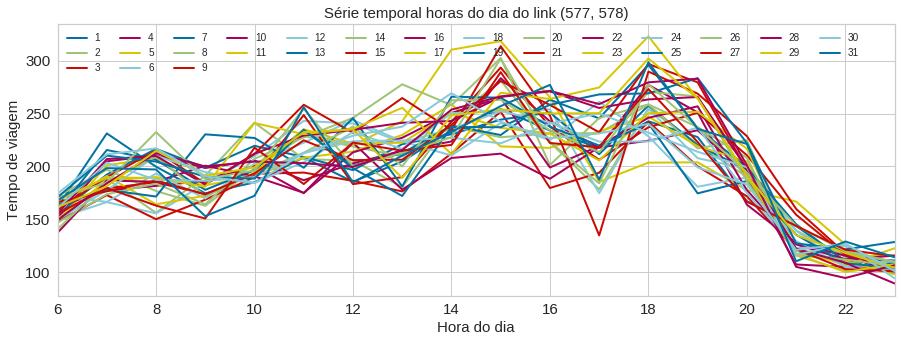

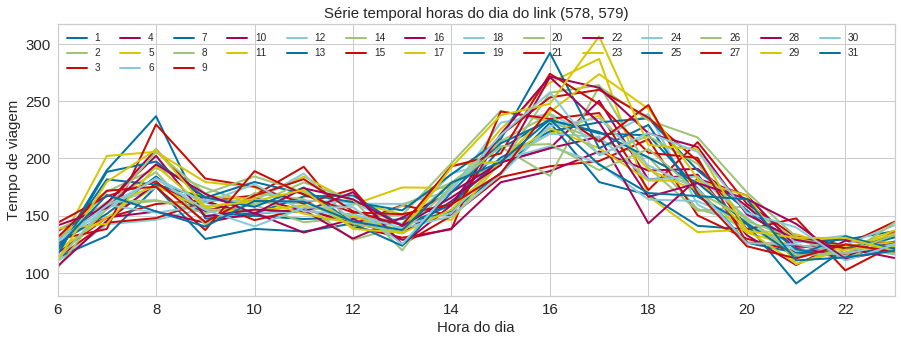

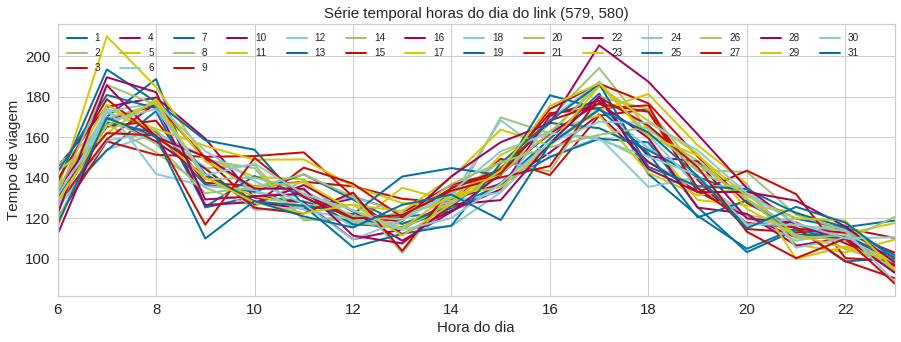

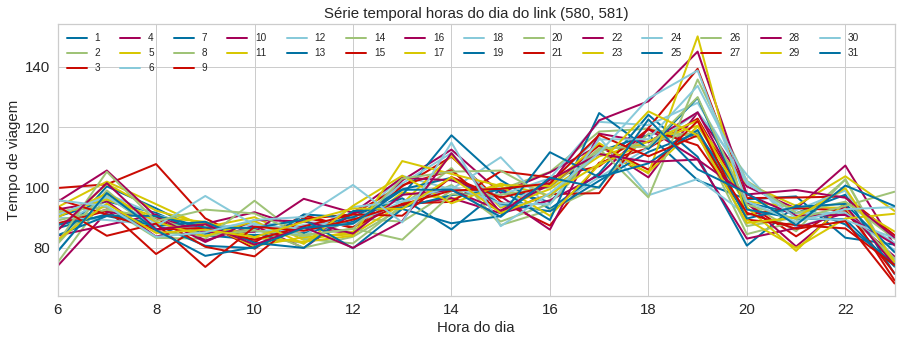

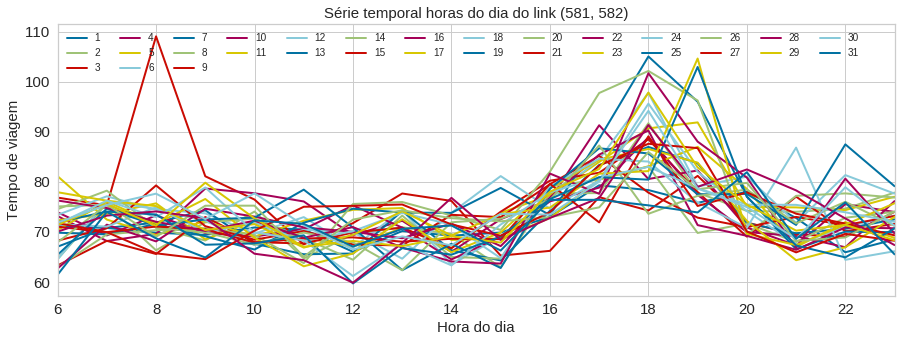

...

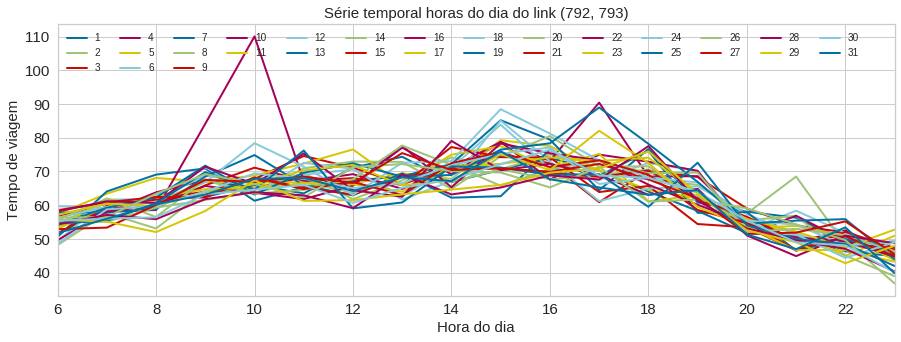

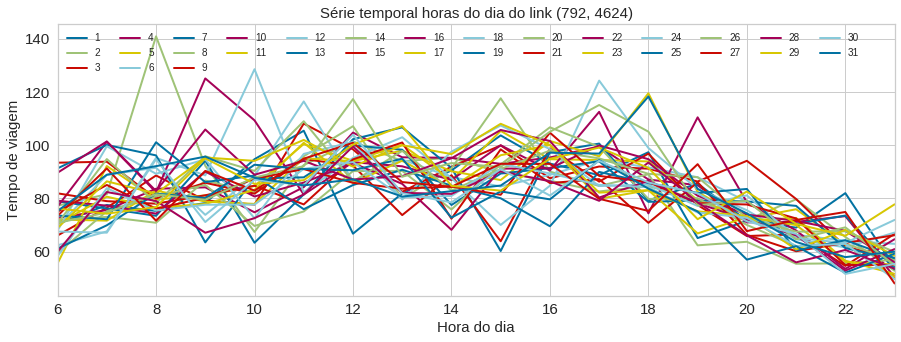

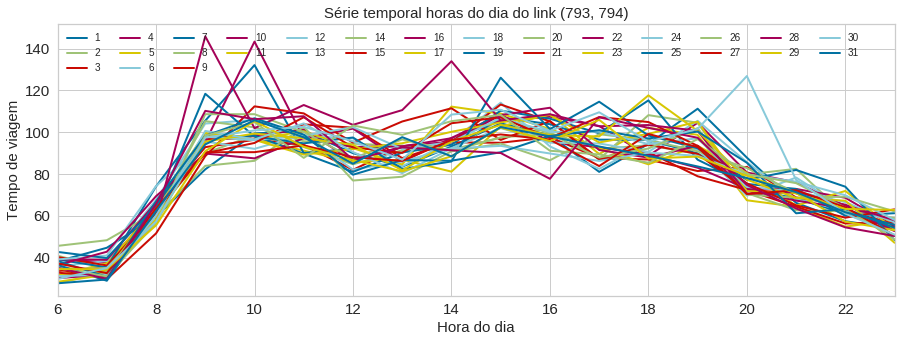

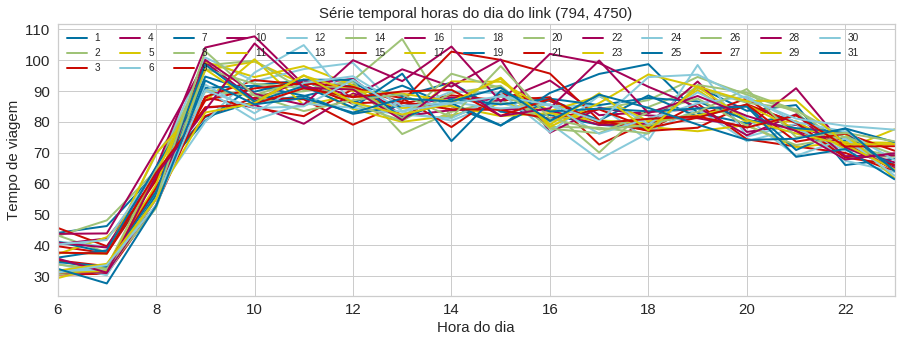

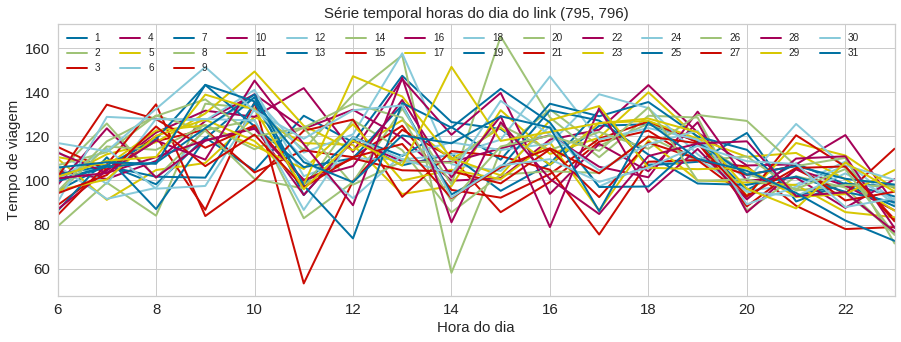

In [16]:
# no_outlier
for link in all_links['all_links']:
    link_ltt = no_outlier.loc[(no_outlier['link'] == link)].groupby(['day_hour', 'day'], as_index=True )['ltt'].mean().unstack()
#     print(link_ltt)
    link_ltt.plot(figsize=(15,5), linewidth=2, fontsize=15, marker = "")
    plt.legend(loc='upper left', bbox_to_anchor=(0, 1), shadow=True, ncol=14)
    plt.title('Série temporal horas do dia do link '+ link, fontsize=15)
    plt.xlabel('Hora do dia', fontsize=15);
    plt.ylabel('Tempo de viagem', fontsize=15);

In [17]:
no_outlier

,aproxlinkstart,hour,link,ltt,trip_id,day,day_hour,time_stamp_start
aproxlinkstart,,,,,,,,
2017-01-02 06:26:46.054,2017-01-02 06:26:46.054,6,"(577, 578)",192.242289,6475-10-0,2,6,1.483338e+09
2017-01-02 06:57:03.961,2017-01-02 06:57:03.961,6,"(577, 578)",286.324701,6475-10-0,2,6,1.483340e+09
2017-01-02 08:13:46.511,2017-01-02 08:13:46.511,8,"(577, 578)",293.185922,6475-10-0,2,8,1.483345e+09
2017-01-02 08:21:14.066,2017-01-02 08:21:14.066,8,"(577, 578)",235.008145,6475-10-0,2,8,1.483345e+09
2017-01-02 09:00:19.122,2017-01-02 09:00:19.122,9,"(577, 578)",339.417900,6475-10-0,2,9,1.483348e+09
...,...,...,...,...,...,...,...,...
2017-09-29 21:04:53.677,2017-09-29 21:04:53.677,21,"(795, 796)",107.890092,2080-10-0,29,21,1.506719e+09
2017-09-29 21:32:17.581,2017-09-29 21:32:17.581,21,"(795, 796)",85.350079,2080-10-0,29,21,1.506721e+09
2017-09-29 21:41:39.458,2017-09-29 21:41:39.458,21,"(795, 796)",89.538335,2080-10-0,29,21,1.506721e+09


In [18]:
df_outlier = no_outlier.drop(columns=['time_stamp_start'])

In [152]:
#este primeiro tipo de regressão usa 4 links vizinhos (dois à frente e dois passados) para a previsão
def regressaoLinks(link): 
    #print (all_links.loc[link])
    coluna = link + 1
    y = df_temp_grouped.iloc[:, coluna].values
    #se o link for o primeiro ou o segundo, o modelo usará o horário e o tempo medio de viagem em cada horario para fazer uma previsão 
    if (coluna < 3) and (coluna > 37): 
        x = df_temp_grouped.iloc[:, 42:43].values
    else:
        x = df_temp_grouped.iloc[:, (coluna-2):(coluna+3)]
        coluna_referencia = str(all_links.iloc[link, 0])
        x = x.drop(columns=[coluna_referencia])
        x = x.iloc[:, :].values
    modelo = LinearRegression()
    modelo.fit(x,y)
    
    previsoes = modelo.predict(x)
    
    previsoes_dt = pd.DataFrame(previsoes)
    previsoes_dt = previsoes_dt.rename(columns={0: "Tempo previsto"})
    previsoes_dt['Tempo real'] = y
    
    MAPE = []
    
    for i in range(len(y)):
        MAPE.append(mean_absolute_percentage_error(y[i], previsoes[i]))
        
    #mape=pd.DataFrame(MAPE)
    #mape = mape.rename(columns={0: "MAPE"})
    
    previsoes_dt['MAPE'] = MAPE
    previsoes_dt['month'] = df_temp_grouped.loc[:, 'month'].values
    previsoes_dt['day'] = df_temp_grouped.loc[:, 'day'].values
    previsoes_dt['hour'] = df_temp_grouped.loc[:, 'hour'].values
    previsoes_dt['minute'] = df_temp_grouped.loc[:, 'minute'].values
    
    previsoes_dt['horário'] = str(previsoes_dt['hour']) + ":" + str(previsoes_dt['minute'])
    
    
    tempo_previsto = previsoes_dt.loc[:, "Tempo previsto"].values
    tempo_real = previsoes_dt.loc[:, "Tempo real"].values


    plt.scatter(tempo_real, tempo_previsto)
    plt.xlabel('Tempo real', fontsize=15);
    plt.ylabel('Tempo previsto', fontsize=15);
    plt.show()
    
    return previsoes_dt #nessa parte do código é possível visualizar o tempo previsto e o real, bem como o MAPE
    #return mape
    

In [20]:
frequency = '30min' 
rolling_win = 1


df_temp_grouped  = df_outlier.groupby([pd.Grouper(freq=str(frequency)), 'link'], as_index=True ).mean()['ltt'].unstack()\
                .rolling(rolling_win).mean().transform(lambda x: x.fillna(method='ffill')).dropna().reset_index()


df_temp_grouped['aproxlinkstart'] = pd.to_datetime(df_temp_grouped['aproxlinkstart'], format = '%H:%M:%S')

df_temp_grouped['aproxlinkstart'].astype('datetime64[M]').astype(int) % 12 + 1

df_temp_grouped['month'] = pd.to_datetime(np.array(df_temp_grouped['aproxlinkstart'])).month
df_temp_grouped['day'] = pd.to_datetime(np.array(df_temp_grouped['aproxlinkstart'])).day
df_temp_grouped['hour'] = pd.to_datetime(np.array(df_temp_grouped['aproxlinkstart'])).hour
df_temp_grouped['minute'] = pd.to_datetime(np.array(df_temp_grouped['aproxlinkstart'])).minute
df_temp_grouped['weekday'] = df_temp_grouped['aproxlinkstart'].dt.strftime('%w')

In [21]:
df_temp_grouped

link,aproxlinkstart,"(577, 578)","(578, 579)","(579, 580)","(580, 581)","(581, 582)","(582, 17509)","(582, 17779)","(582, 17933)","(583, 13761)",...,"(792, 4624)","(792, 793)","(793, 794)","(794, 4750)","(795, 796)",month,day,hour,minute,weekday
0,2017-02-02 07:30:00,289.237011,157.826833,210.849108,161.732898,121.484291,111.261836,83.130729,105.292490,259.805494,...,76.610594,53.619871,32.557812,31.668093,85.155114,2,2,7,30,4
1,2017-02-02 08:00:00,219.063097,225.561376,215.260405,85.516196,74.024743,111.261836,86.094822,110.690461,259.805494,...,107.855903,42.652169,28.782934,37.892786,106.685418,2,2,8,0,4
2,2017-02-02 08:30:00,219.063097,225.561376,164.147500,91.173841,110.650180,84.771613,80.575354,129.130431,119.315498,...,95.327923,59.853027,112.612079,94.380350,106.685418,2,2,8,30,4
3,2017-02-02 09:00:00,114.918264,114.852321,89.127218,103.716152,65.097708,84.771613,99.066078,118.771487,232.961624,...,95.327923,56.347985,85.318729,108.664804,106.685418,2,2,9,0,4
4,2017-02-02 09:30:00,139.574264,127.921857,109.118407,69.386070,83.842155,84.771613,104.071851,116.456006,232.961624,...,95.327923,69.729394,105.821057,82.882038,252.422095,2,2,9,30,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5953,2017-09-29 21:30:00,142.851109,175.809094,134.551482,116.287058,79.028317,106.308689,90.014899,117.833095,184.373272,...,79.742900,61.707061,65.648782,71.852533,87.444207,9,29,21,30,5
5954,2017-09-29 22:00:00,142.851109,175.809094,140.614131,148.519092,72.921301,106.308689,104.621540,123.528007,184.373272,...,57.882777,55.120825,58.912525,73.637452,61.377175,9,29,22,0,5
5955,2017-09-29 22:30:00,105.458968,155.726974,118.914929,112.411645,85.739391,106.308689,90.329524,115.405431,75.281792,...,84.812291,55.338802,82.706272,85.803834,129.609477,9,29,22,30,5
5956,2017-09-29 23:00:00,185.115917,173.697660,127.266019,111.980840,76.392729,106.308689,121.179062,117.835649,122.612234,...,75.237152,71.177926,45.891054,73.666254,129.609477,9,29,23,0,5


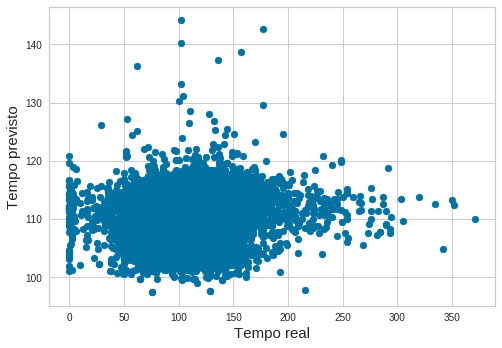

,Tempo previsto,Tempo real,MAPE,month,day,hour,minute,horário
0,101.910380,85.155114,19.676171,2,2,7,30,0 7\n1 8\n2 8\n3 9...
1,102.017549,106.685418,4.375357,2,2,8,0,0 7\n1 8\n2 8\n3 9...
2,112.405814,106.685418,5.361929,2,2,8,30,0 7\n1 8\n2 8\n3 9...
3,111.166191,106.685418,4.199987,2,2,9,0,0 7\n1 8\n2 8\n3 9...
4,111.110353,252.422095,55.982319,2,2,9,30,0 7\n1 8\n2 8\n3 9...
...,...,...,...,...,...,...,...,...
5953,110.302069,87.444207,26.139938,9,29,21,30,0 7\n1 8\n2 8\n3 9...
5954,109.881982,61.377175,79.027435,9,29,22,0,0 7\n1 8\n2 8\n3 9...
5955,112.576992,129.609477,13.141389,9,29,22,30,0 7\n1 8\n2 8\n3 9...
5956,108.845581,129.609477,16.020353,9,29,23,0,0 7\n1 8\n2 8\n3 9...


In [153]:
previsoes_dt = regressaoLinks(38)
previsoes_dt

In [95]:
all_links

,all_links
0,"(577, 578)"
1,"(578, 579)"
2,"(579, 580)"
3,"(580, 581)"
4,"(581, 582)"
5,"(582, 17509)"
6,"(582, 17779)"
7,"(582, 17933)"
8,"(583, 13761)"
9,"(637, 638)"


In [124]:
lista = []
for i in range(len(df_temp_grouped)):
    if (previsoes_dt.loc[i,'Tempo real'])>250:
        lista.append(previsoes_dt.loc[i,'Tempo real'])
len(lista)

44